# Machine Learning Basics (Part I)

## Introduction to Julia

1. Julia is fast
2. Dynamic (optionally typed)
3. Multiple dispatch (i.e., method implementation is selected based on run-time type)
   - allows for object-oriented &amp; functional paradigms
4. Numerical computing

   ```julia
   x = [1.0, 2.0]
   z = x' * x
   # 5.0
   ```
   
   compared to
   
   ```python
   import numpy as np
   x = np.array([1.0, 2.0])
   z = np.dot(x, x)
   # 5.0 
   ```

### Setting up an environment

Julia can be installed on Linux or macOS and comes with a REPL

```sh
# linux
curl -LO https://julialang-s3.julialang.org/bin/linux/x64/1.0/julia-1.0.0-linux-x86_64.tar.gz
tar xzf julia-1.0.0-linux-x86_64.tar.gz -C /usr/local
/usr/local/julia-1.0.0/bin/julia

# macOS
brew cask install julia
julia
```

You can also use Julia with JupyterLab; first install `jupyterlab`

```sh
pip3 install jupyterlab

# install extension for rendering plotly.js-based plots inline
# requires nodejs be installed
jupyter labextension install @jupyterlab/plotly-extension
```

Then install the `IJulia` kernel

```julia
using Pkg

# IJulia will install jupyter by default
# this configures it to use the version we installed w/ pip
ENV["JUPYTER"] = "jupyter"
Pkg.add("IJulia")
Pkg.add("Plots")

# precompile the packages
using IJulia
using Plots
```

Or run it as a Docker container: [https://github.com/bradfordboyle/docker-jupyterlab](https://github.com/bradfordboyle/docker-jupyterlab)

### Julia language

Material here is a subset of the material found here: [https://github.com/JuliaComputing/JuliaBoxTutorials](https://github.com/JuliaComputing/JuliaBoxTutorials)

#### Getting help in the REPL

In [1]:
?println

search: println printstyled print sprint isprint



```
println([io::IO], xs...)
```

Print (using [`print`](@ref)) `xs` followed by a newline. If `io` is not supplied, prints to [`stdout`](@ref).

# Examples

```jldoctest
julia> println("Hello, world")
Hello, world

julia> io = IOBuffer();

julia> println(io, "Hello, world")

julia> String(take!(io))
"Hello, world\n"
```


#### Shelling Out

In [2]:
;uptime

 23:47:07 up 1 day,  4:45,  0 users,  load average: 0.18, 0.09, 0.04


## Linear Regression
1. Task: fitting a function (linear) to a dataset
2. Experience: data set
   - design matrix (?)
   - each row is one observation
3. Performance: mean square distance/error (usually L_2, normal distance) L_1 ( manhattan distance)

In [3]:
X = [[1, 2]  [2, 1]]

2×2 Array{Int64,2}:
 1  2
 2  1

In [4]:
w = [1, 1]
b = 0.5
f(X) = X * w .+ b

f (generic function with 1 method)

In [5]:
f(X)

2-element Array{Float64,1}:
 3.5
 3.5

In [6]:
g(w, b) = X * w .+ b

g (generic function with 1 method)

In [7]:
function build_lr_model(training_data)
    g(w, b) = training_data * w .+ b
    return g
end

build_lr_model (generic function with 1 method)

In [8]:
h = build_lr_model(X)

(::getfield(Main, Symbol("#g#3")){Array{Int64,2}}) (generic function with 1 method)

In [9]:
h([0.5, 0.5], 1)

2-element Array{Float64,1}:
 2.5
 2.5

In [10]:
training_features = X
target_values = [0.35, 0.75]

2-element Array{Float64,1}:
 0.35
 0.75

In [11]:
function lr_cost(target_values, estimated_values)
    num_examples = length(target_values)
    total_cost = sum([(target_values[i] - estimated_values[i])^2 for i in 1:num_examples])
    return 1.0 / num_examples * total_cost
end

lr_cost (generic function with 1 method)

In [12]:
lr_cost(target_values, h([0.5, 0.5], 2))

8.7425

In [13]:
lr_cost(target_values, h([0.5, 0.5], 3))

15.642500000000002

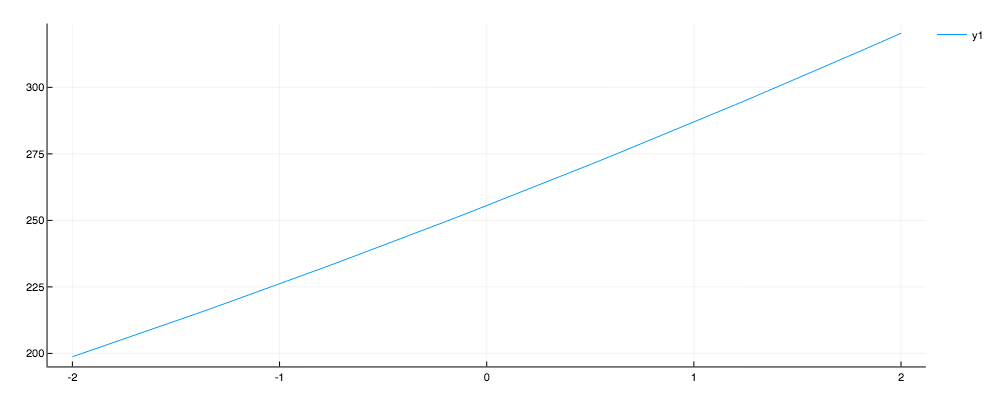

In [14]:
x = -2:0.1:2
y = [lr_cost(target_values, h([0.5, 10], b)) for b in x]

using Plots
plotly()

plot(x, y)